In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
import os
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import rcParams

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_log_error

from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

from statsmodels.regression.linear_model import OLS
from sklearn.feature_selection import RFE
from sklearn.linear_model import Ridge

from statsmodels.tools import add_constant
from sklearn.preprocessing import StandardScaler 
from sklearn.metrics import classification_report


from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import Lasso
import statsmodels.formula.api as sm


import warnings; warnings.simplefilter('ignore')
import statsmodels.api as smf


In [3]:
cd "C:\Users\Rucha Wete\Downloads\whole\Delhi"

C:\Users\Rucha Wete\Downloads\whole\Delhi


In [4]:
path = "C:\\Users\\Rucha Wete\\Downloads\\whole\\Delhi"

# Get a list of all the CSV files in the folder
csv_files = os.listdir(path)

# Create an empty DataFrame
df = pd.DataFrame()

# Iterate over the CSV files
for csv_file in csv_files:

    # Read the CSV file into a DataFrame
    df_temp = pd.read_csv(os.path.join(path, csv_file))

    # Add the DataFrame to the main DataFrame
    df = df.append(df_temp)

In [5]:
df

,From Date,To Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),...,Benzene (),SR (),Temp (ug/m3),WD (),SO2 (),RH (),BP (),Eth-Benzene (),Xylene (),CH4 ()
0,2021-08-06 17:00:00,2021-08-06 18:00:00,54.50,111.25,2.58,64.60,36.45,34.35,9.30,0.61,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-08-06 18:00:00,2021-08-06 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-08-06 19:00:00,2021-08-06 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-08-06 20:00:00,2021-08-06 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-08-06 21:00:00,2021-08-06 22:00:00,239.67,276.67,12.27,101.43,63.90,19.83,2.20,1.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36458,2023-03-31 19:00:00,2023-03-31 20:00:00,32.90,62.99,9.74,42.94,52.68,36.79,3.89,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36459,2023-03-31 20:00:00,2023-03-31 21:00:00,34.22,66.46,9.53,40.98,50.51,36.08,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36460,2023-03-31 21:00:00,2023-03-31 22:00:00,33.00,71.68,9.77,41.26,51.04,37.05,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36461,2023-03-31 22:00:00,2023-03-31 23:00:00,33.65,76.43,9.53,40.32,49.84,34.95,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Data Pre Processing

In [6]:
df['From Date'] = pd.to_datetime(df['From Date'])
df['Year'] = df['From Date'].dt.year
df['Month'] = df['From Date'].dt.month
df['Day'] = df['From Date'].dt.day
df['Time'] = df['From Date'].dt.time

In [7]:
df.drop(['To Date','From Date'], axis='columns',inplace= True)

In [8]:
df

,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),Ozone (ug/m3),Benzene (ug/m3),...,SO2 (),RH (),BP (),Eth-Benzene (),Xylene (),CH4 (),Year,Month,Day,Time
0,54.50,111.25,2.58,64.60,36.45,34.35,9.30,0.61,89.03,0.55,...,NaN,NaN,NaN,NaN,NaN,NaN,2021,8,6,17:00:00
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2021,8,6,18:00:00
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2021,8,6,19:00:00
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2021,8,6,20:00:00
4,239.67,276.67,12.27,101.43,63.90,19.83,2.20,1.09,11.83,2.00,...,NaN,NaN,NaN,NaN,NaN,NaN,2021,8,6,21:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36458,32.90,62.99,9.74,42.94,52.68,36.79,3.89,NaN,22.40,1.33,...,NaN,NaN,NaN,NaN,NaN,NaN,2023,3,31,19:00:00
36459,34.22,66.46,9.53,40.98,50.51,36.08,NaN,NaN,22.80,1.29,...,NaN,NaN,NaN,NaN,NaN,NaN,2023,3,31,20:00:00
36460,33.00,71.68,9.77,41.26,51.04,37.05,NaN,NaN,21.69,1.31,...,NaN,NaN,NaN,NaN,NaN,NaN,2023,3,31,21:00:00
36461,33.65,76.43,9.53,40.32,49.84,34.95,NaN,NaN,21.88,1.31,...,NaN,NaN,NaN,NaN,NaN,NaN,2023,3,31,22:00:00


In [9]:
valuelist = [x  for x in df.columns if x not in ['Year','Month','Day','Time'] ]

In [10]:
df = df.pivot_table(index=['Year','Month','Day'],
                    values = valuelist, 
               aggfunc='mean',

)

In [ ]:
df.drop(['BP ()','AT ()','Benzene ()','CH4 ()','CO (ng/m3)','CO (ug/m3)','MP-Xylene ()','Ozone (ppb)','RH ()',
         'SO2 ()','SR ()','Toluene ()','WD ()','WD (degree C)','WD (degree)','WS ()','Xylene ()','NOx (ppb)'
         ], axis='columns',inplace= True)

Dealing with Null Values

In [13]:
df.isna()

AT (degree C)  BP (mmHg)  Benzene (ug/m3)  CH4 (ug/m3)  \
Year Month Day                                                           
2010 1     1             True      False            False        False   
           2             True      False            False        False   
           3             True      False            False        False   
           4             True      False            False        False   
           5             True      False            False        False   
...                       ...        ...              ...          ...   
2023 3     27           False      False            False        False   
           28           False      False            False        False   
           29           False      False            False        False   
           30           False      False            False        False   
           31           False      False            False        False   

                CO (mg/m3)  Eth-Benzene (ug/m3)  HCHO (ug/m3)  Hg (ug/m3)  \
Year Month Day                                                              
2010 1     1         False                False          True        True   
           2         False                False          True        True   
           3         False                False          True        True   
           4         False                False          True        True   
           5         False                False          True        True   
...                    ...                  ...           ...         ...   
2023 3     27        False                False         False       False   
           28        False                False         False       False   
           29        False                False          True        True   
           30        False                False          True        True   
           31        False                False          True        True   

                MH (m)  MP-Xylene (ug/m3)  ...  RH (%)  SO2 (ug/m3)  \
Year Month Day                             ...                        
2010 1     1      True              False  ...   False        False   
           2      True              False  ...   False        False   
           3      True              False  ...   False        False   
           4      True              False  ...   False        False   
           5      True              False  ...   False        False   
...                ...                ...  ...     ...          ...   
2023 3     27    False              False  ...   False        False   
           28    False              False  ...   False        False   
           29    False              False  ...   False        False   
           30    False              False  ...   False        False   
           31    False              False  ...   False        False   

                SR (W/mt2)  THC (ug/m3)  Temp (degree C)  Toluene (ug/m3)  \
Year Month Day                                                              
2010 1     1         False        False            False            False   
           2         False        False            False            False   
           3         False        False            False            False   
           4         False        False            False            False   
           5         False        False            False            False   
...                    ...          ...              ...              ...   
2023 3     27        False        False            False            False   
           28        False        False            False            False   
           29        False        False            False            False   
           30        False        False            False            False   
           31        False        False            False            False   

                VWS (m/s)  WD (deg)  WS (m/s)  Xylene (ug/m3)  
Year Month Day                                               

In [14]:
df.isna().sum()

AT (degree C)          1036
BP (mmHg)                 1
Benzene (ug/m3)          51
CH4 (ug/m3)            1466
CO (mg/m3)                0
Eth-Benzene (ug/m3)     290
HCHO (ug/m3)           3342
Hg (ug/m3)             3338
MH (m)                 3028
MP-Xylene (ug/m3)       199
NH3 (ug/m3)             221
NO (ug/m3)                0
NO2 (ug/m3)               0
NOx (ug/m3)            2981
O Xylene (ug/m3)        194
Ozone (ug/m3)             0
PM10 (ug/m3)           1138
PM2.5 (ug/m3)            99
RF (mm)                2618
RH (%)                    1
SO2 (ug/m3)               0
SR (W/mt2)                1
THC (ug/m3)            1121
Temp (degree C)           5
Toluene (ug/m3)          64
VWS (m/s)               528
WD (deg)                  7
WS (m/s)                  2
Xylene (ug/m3)         1129
dtype: int64

**Using Heatmap to find the missing values**

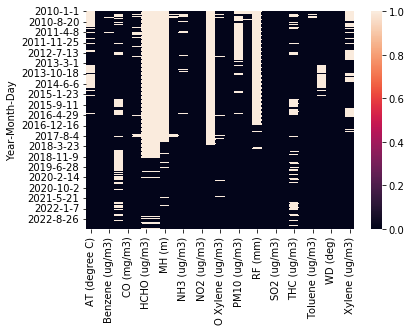

In [15]:
# Finding null values with the help of HeatMap

sns.heatmap(df.isna())

In [16]:
valuelist = df.columns
valuelist

Index(['AT (degree C)', 'BP (mmHg)', 'Benzene (ug/m3)', 'CH4 (ug/m3)',
       'CO (mg/m3)', 'Eth-Benzene (ug/m3)', 'HCHO (ug/m3)', 'Hg (ug/m3)',
       'MH (m)', 'MP-Xylene (ug/m3)', 'NH3 (ug/m3)', 'NO (ug/m3)',
       'NO2 (ug/m3)', 'NOx (ug/m3)', 'O Xylene (ug/m3)', 'Ozone (ug/m3)',
       'PM10 (ug/m3)', 'PM2.5 (ug/m3)', 'RF (mm)', 'RH (%)', 'SO2 (ug/m3)',
       'SR (W/mt2)', 'THC (ug/m3)', 'Temp (degree C)', 'Toluene (ug/m3)',
       'VWS (m/s)', 'WD (deg)', 'WS (m/s)', 'Xylene (ug/m3)'],
      dtype='object')

In [19]:
def plot_distributions(original,new: dict):
    fig, ax = plt.subplots(figsize=(15, 13), dpi=100)
    sns.kdeplot(
        original, linewidth=8, ax=ax, color="#000000", label="Original distribution"
    )
    for key, value in new.items():
        sns.kdeplot(value, linewidth=3, label=key, ax=ax)
    plt.legend()
    plt.show()

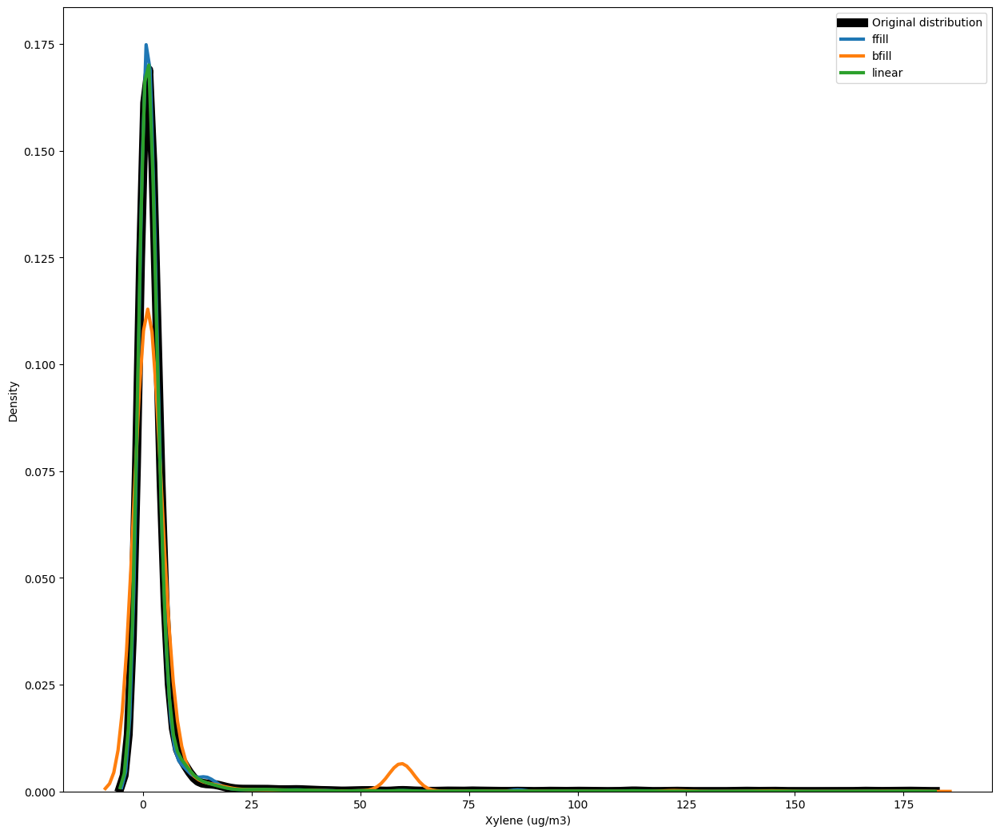

In [21]:
sample = df

for method in ["ffill", "bfill"]:
    sample[method] = eval(f"sample['Xylene (ug/m3)'].{method}()")
sample['linear'] = sample['Xylene (ug/m3)'].interpolate(method="linear",)
plot_distributions(sample["Xylene (ug/m3)"], {"ffill": sample["ffill"], "bfill": sample["bfill"],"linear": sample["linear"]})

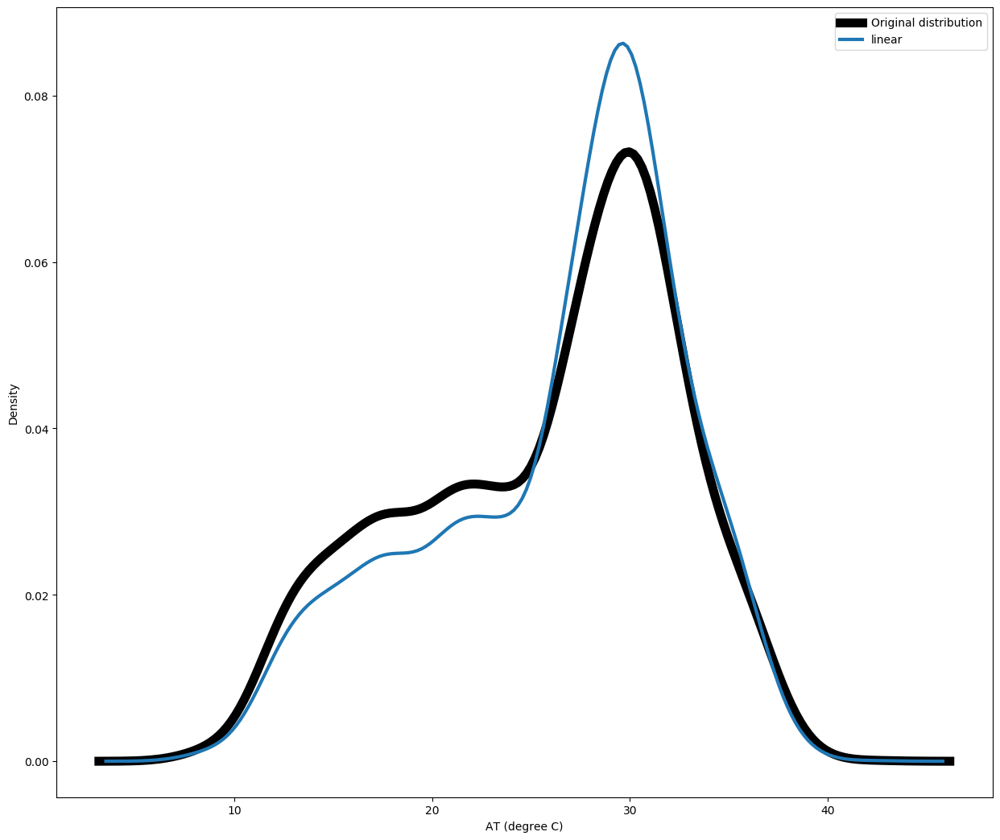

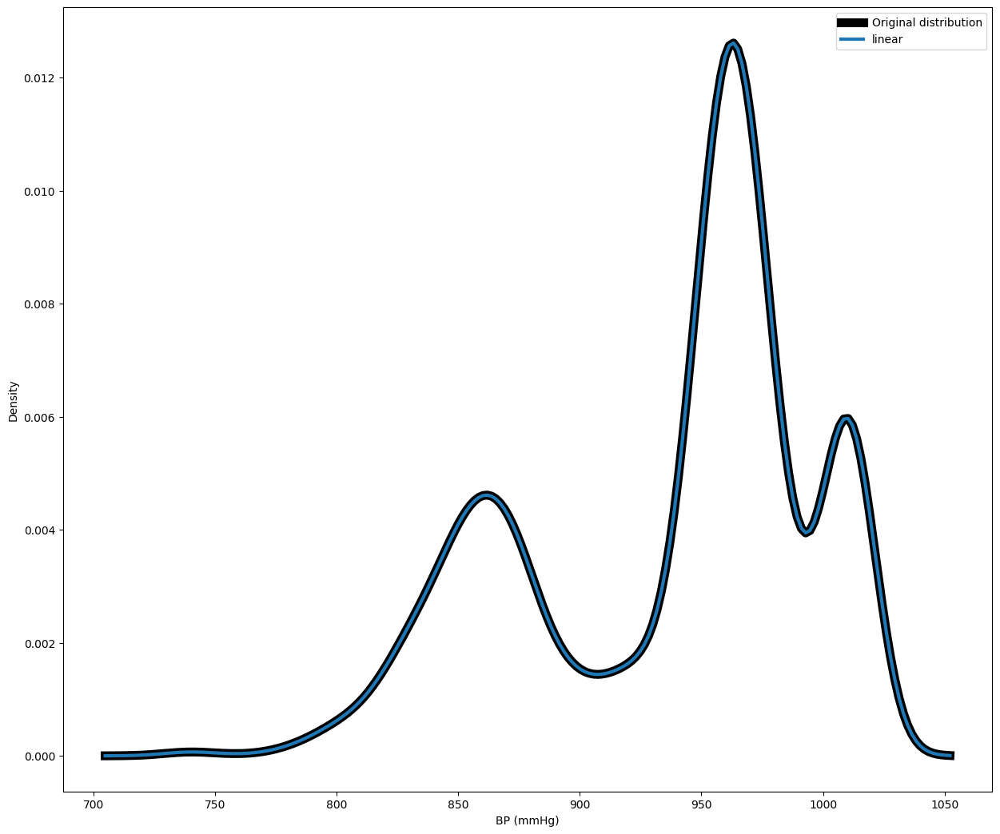

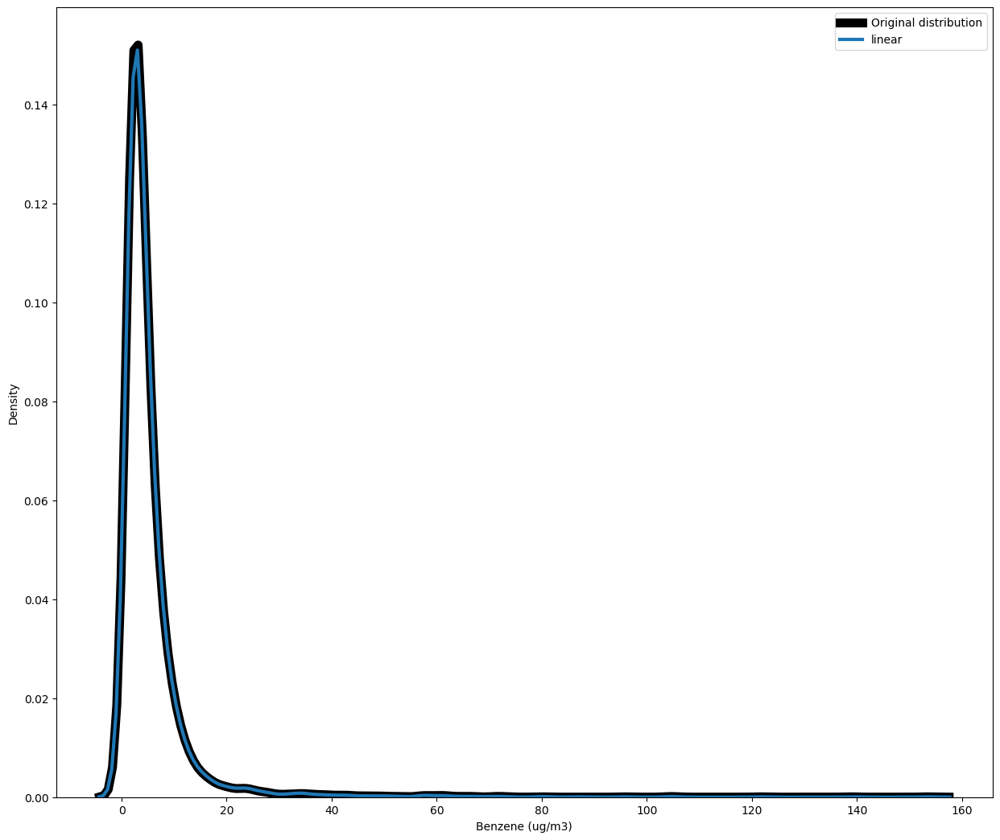

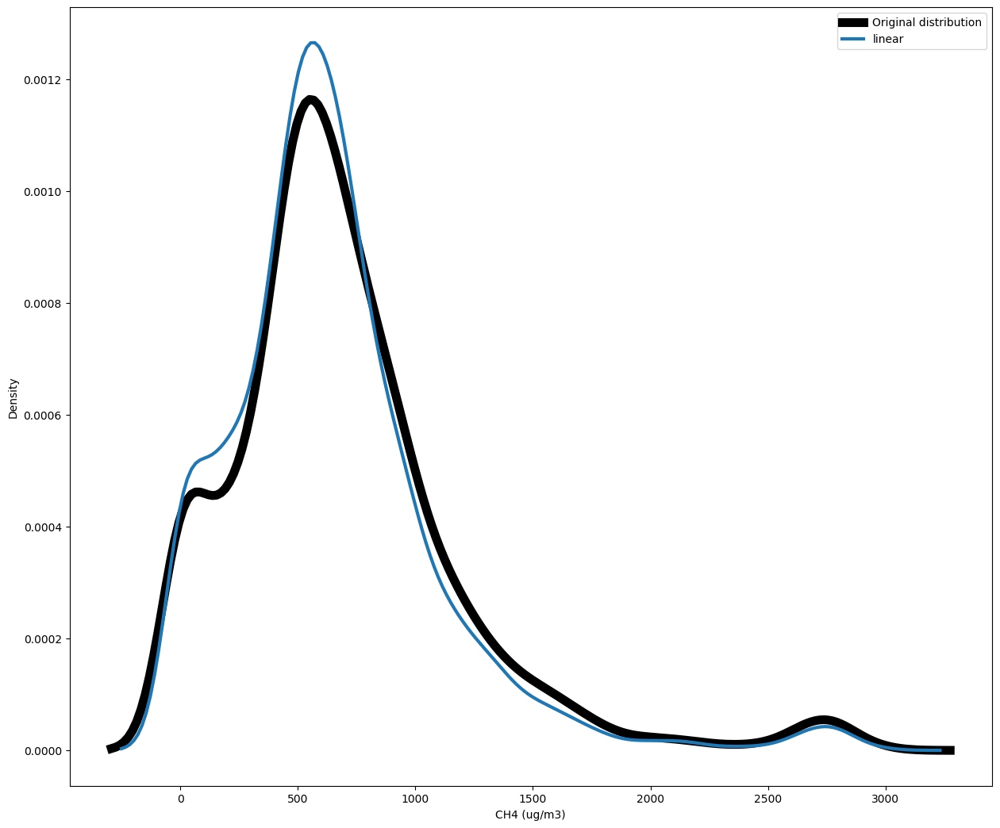

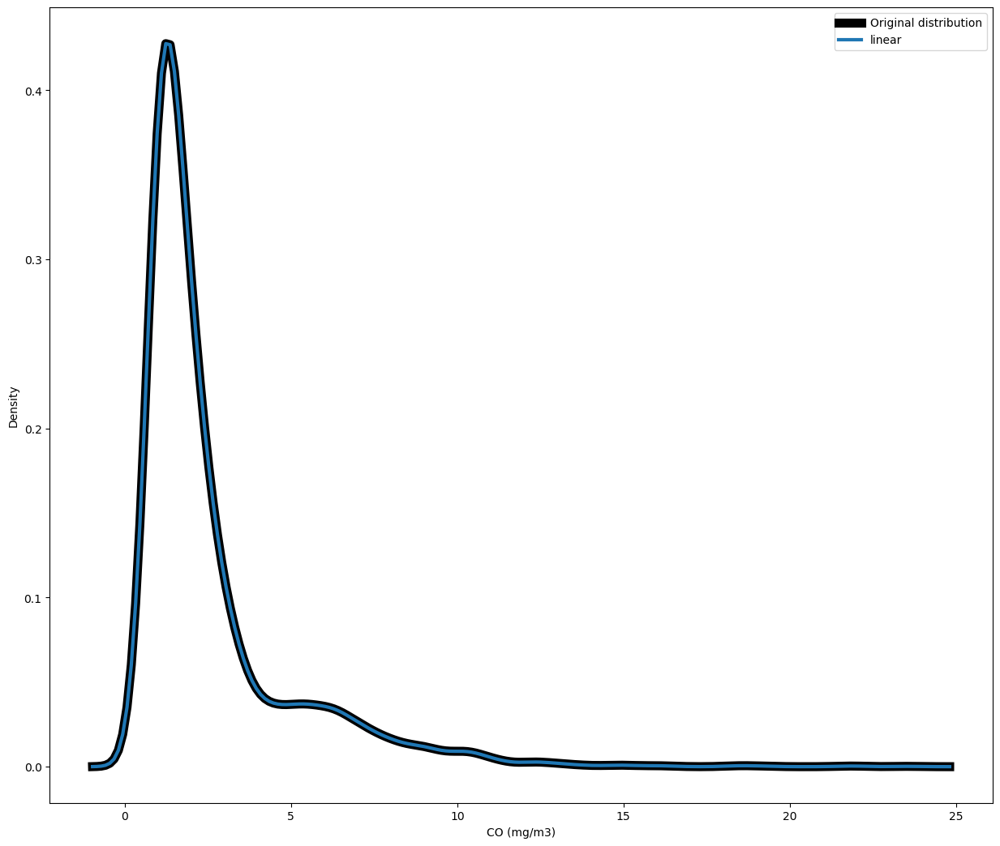

...

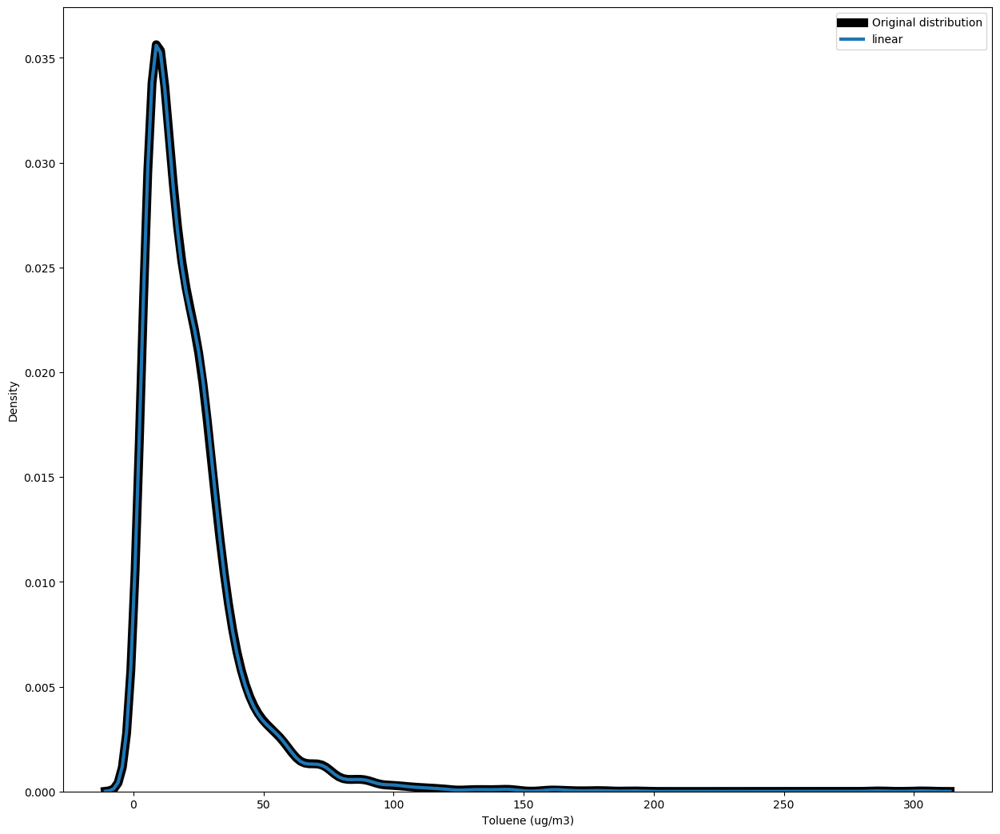

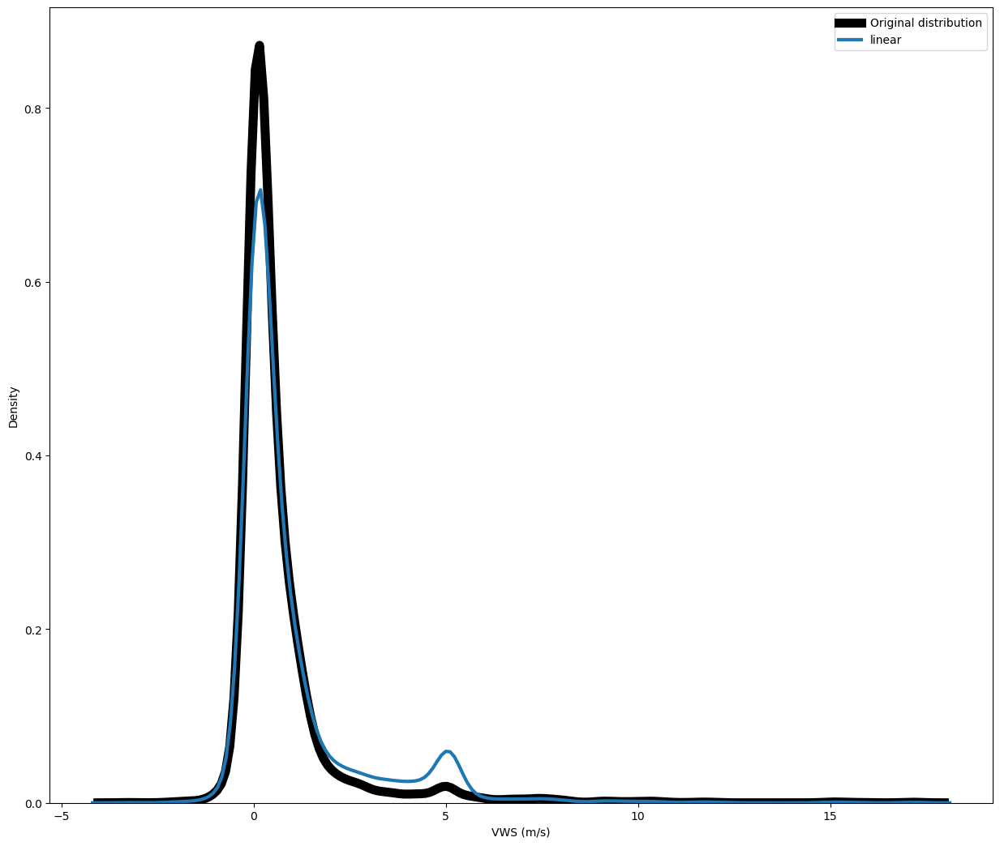

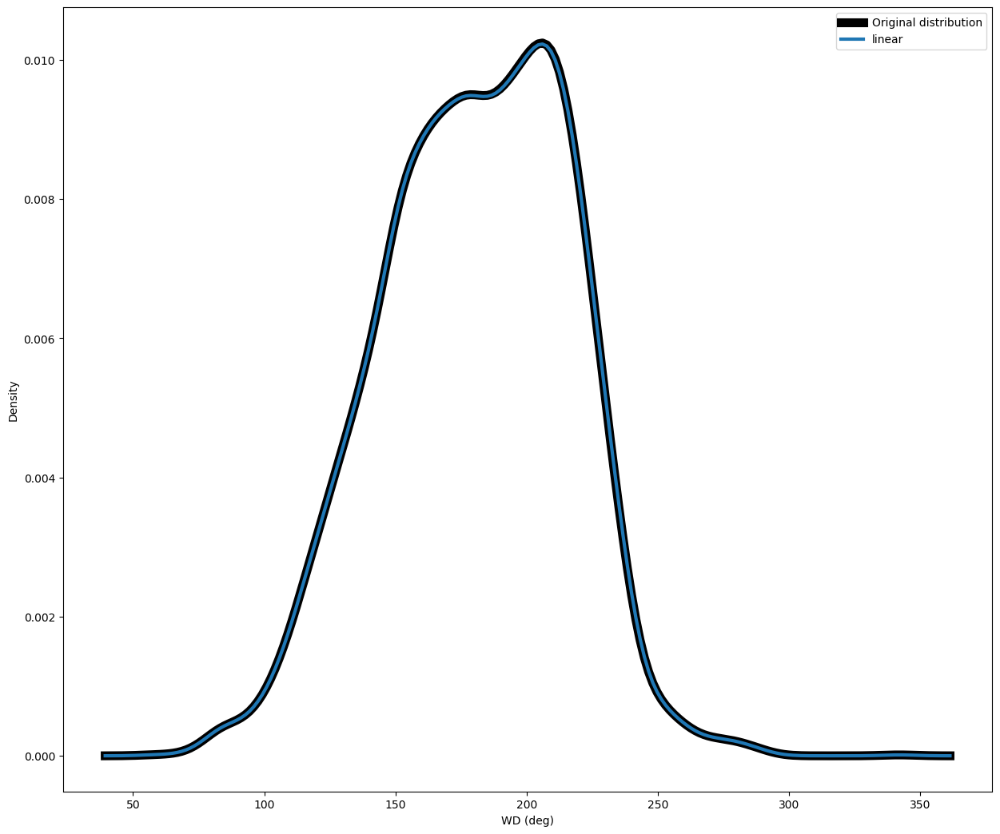

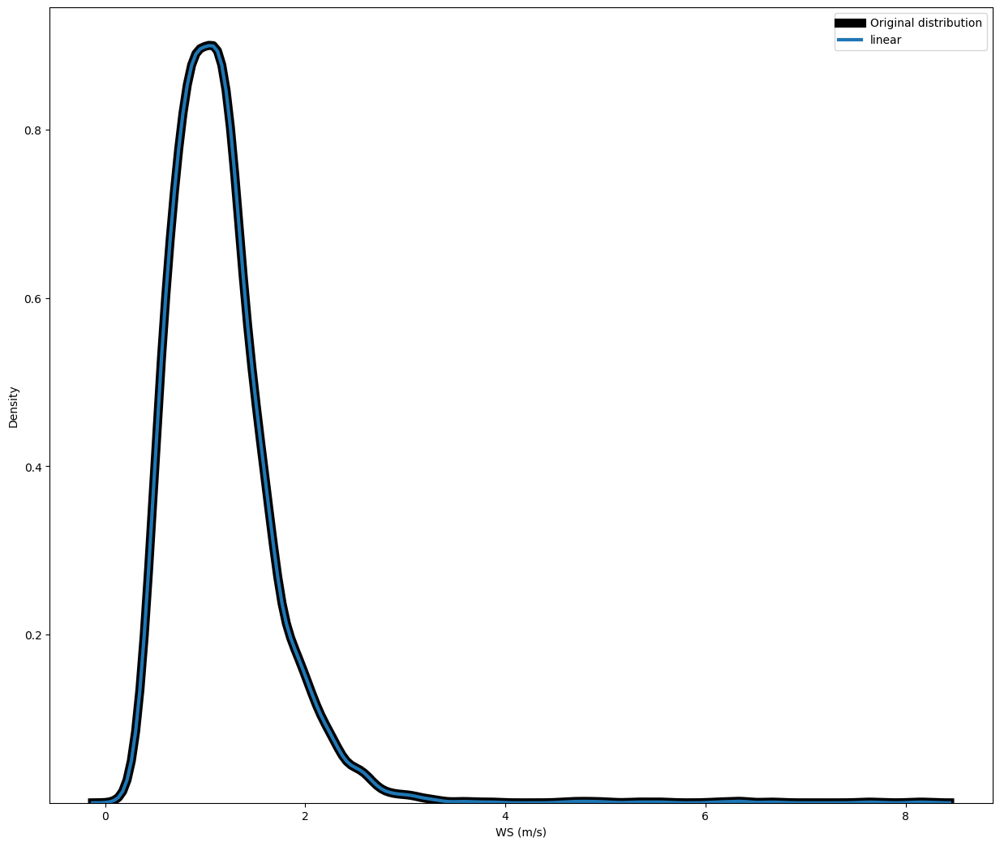

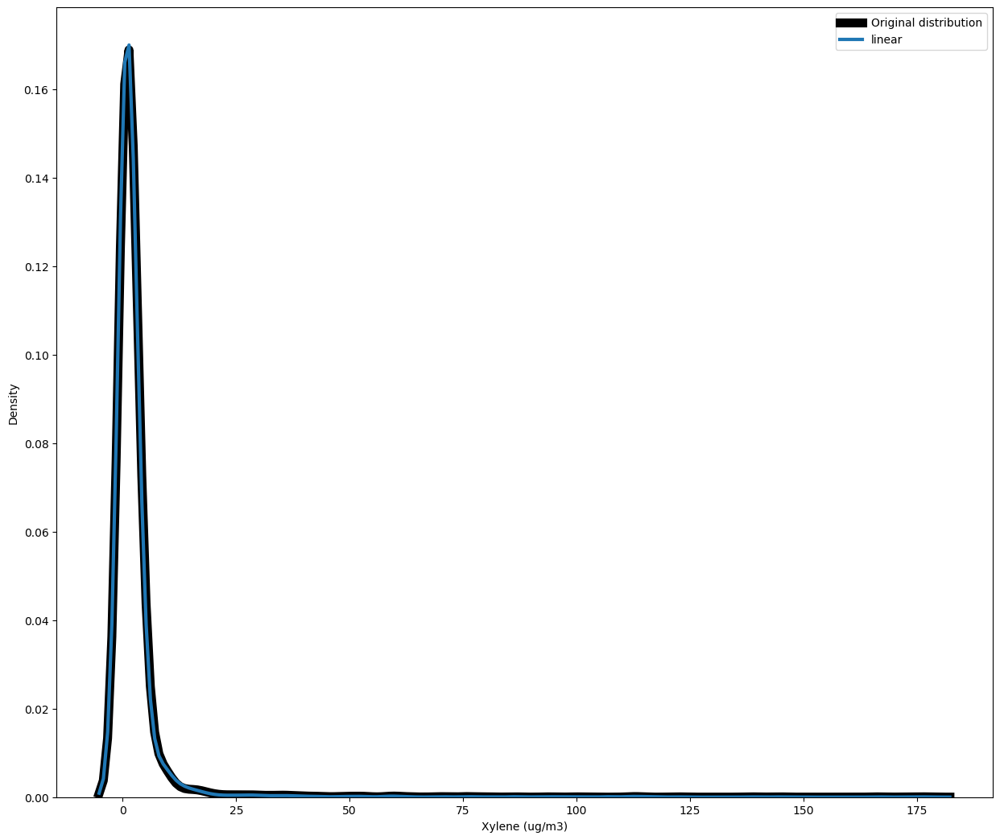

In [22]:
for category in valuelist: 
    sample = df
    sample["linear"] = sample[category].interpolate(method="linear")
    plot_distributions(sample[category], {"linear":air_q["linear"]})

In [23]:
data = df.interpolate(method="linear",limit_area=None,limit=10000)

In [24]:
data

AT (degree C)   BP (mmHg)  Benzene (ug/m3)  CH4 (ug/m3)  \
Year Month Day                                                            
2010 1     1              NaN  981.028750        19.982917  1027.188333   
           2              NaN  982.769167        12.072083   964.979167   
           3              NaN  980.149211         9.544167  1142.365714   
           4              NaN  962.201379         4.172727  1014.711667   
           5              NaN  942.788472        13.799524  1138.242917   
...                       ...         ...              ...          ...   
2023 3     27       22.339199  962.164317         1.513354   556.965294   
           28       22.834654  961.014223         1.785769   489.068667   
           29       23.743489  961.397572         2.320779   587.812000   
           30       22.289932  959.281301         2.171747   654.698333   
           31       20.387590  958.995781         1.233512   567.246364   

                CO (mg/m3)  Eth-Benzene (ug/m3)  HCHO (ug/m3)  Hg (ug/m3)  \
Year Month Day                                                              
2010 1     1      3.243864             5.729286           NaN         NaN   
           2      2.636296             0.946667           NaN         NaN   
           3      2.838395             0.795000           NaN         NaN   
           4      2.154154             2.466667           NaN         NaN   
           5      4.978065            11.025333           NaN         NaN   
...                    ...                  ...           ...         ...   
2023 3     27     1.074256             1.071325     45.796923    1.990417   
           28     1.184740             1.399634     34.730000    2.169000   
           29     1.241884             1.405528     34.730000    2.169000   
           30     1.166790             2.016772     34.730000    2.169000   
           31     1.010818             1.069060     34.730000    2.169000   

                    MH (m)  MP-Xylene (ug/m3)  ...  THC (ug/m3)  \
Year Month Day                                 ...                
2010 1     1           NaN          11.114737  ...  1454.920870   
           2           NaN           1.308125  ...  1331.328333   
           3           NaN           0.686000  ...  1322.743571   
           4           NaN           2.271500  ...  1391.822917   
           5           NaN          18.898966  ...   993.823889   
...                    ...                ...  ...          ...   
2023 3     27   525.416667           2.854278  ...   621.686667   
           28   491.176471           3.326994  ...   793.223000   
           29   449.583333           1.953292  ...   675.118182   
           30   477.000000           3.158295  ...   787.912500   
           31   517.222222           1.491689  ...   638.780000   

                Temp (degree C)  Toluene (ug/m3)  VWS (m/s)    WD (deg)  \
Year Month Day                                                            
2010 1     1          13.037361        51.594167   0.588958  206.450208   
           2           9.940694        14.522609   0.624375  212.582500   
           3          11.552581        12.606250   0.498684  200.717083   
           4          10.988415         7.122581   0.568400  197.081034   
           5          12.105417        33.070000   0.592083  145.579155   
...                         ...              ...        ...         ...   
2023 3     27         20.603036         8.116282   0.438625  197.380417   
           28         21.741712        10.885060   0.167875  191.721713   
           29         23.027611        11.397922   0.155758  163.291262   
           30         20.573571        11.881039   0.094937  165.611675   
           31         18.681429         9.554672   0.102099  171.239760   

                WS (m/s)  Xylene (ug/m3)     ffill      bfill    linear  
Year Month Day                                                           
2010 1     1    0.318028             NaN  

In [26]:
print(data.isna().sum())

AT (degree C)            89
BP (mmHg)                 0
Benzene (ug/m3)           0
CH4 (ug/m3)               0
CO (mg/m3)                0
Eth-Benzene (ug/m3)       0
HCHO (ug/m3)           3245
Hg (ug/m3)             3245
MH (m)                 2922
MP-Xylene (ug/m3)         0
NH3 (ug/m3)               1
NO (ug/m3)                0
NO2 (ug/m3)               0
NOx (ug/m3)            2981
O Xylene (ug/m3)          0
Ozone (ug/m3)             0
PM10 (ug/m3)             75
PM2.5 (ug/m3)            47
RF (mm)                2531
RH (%)                    0
SO2 (ug/m3)               0
SR (W/mt2)                0
THC (ug/m3)               0
Temp (degree C)           0
Toluene (ug/m3)           0
VWS (m/s)                 0
WD (deg)                  0
WS (m/s)                  0
Xylene (ug/m3)          223
ffill                   223
bfill                     0
linear                  223
dtype: int64


In [27]:
d = data.fillna(data.mean())

In [28]:
d.isna().sum()

AT (degree C)          0
BP (mmHg)              0
Benzene (ug/m3)        0
CH4 (ug/m3)            0
CO (mg/m3)             0
Eth-Benzene (ug/m3)    0
HCHO (ug/m3)           0
Hg (ug/m3)             0
MH (m)                 0
MP-Xylene (ug/m3)      0
NH3 (ug/m3)            0
NO (ug/m3)             0
NO2 (ug/m3)            0
NOx (ug/m3)            0
O Xylene (ug/m3)       0
Ozone (ug/m3)          0
PM10 (ug/m3)           0
PM2.5 (ug/m3)          0
RF (mm)                0
RH (%)                 0
SO2 (ug/m3)            0
SR (W/mt2)             0
THC (ug/m3)            0
Temp (degree C)        0
Toluene (ug/m3)        0
VWS (m/s)              0
WD (deg)               0
WS (m/s)               0
Xylene (ug/m3)         0
ffill                  0
bfill                  0
linear                 0
dtype: int64

The linear method considers the distance between any two non-missing points as linearly spaced and finds a linear line that connects them (like np.linspace).

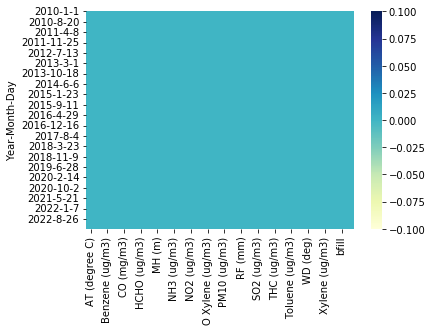

In [29]:
sns.heatmap(d.isna(),cmap="YlGnBu")

**Fetching Year, Month and Date From a Date Column**

In [30]:
d.duplicated().sum()

0

# **DATA VISULIZATION**     

# **Understanding Correlation using heatmap**

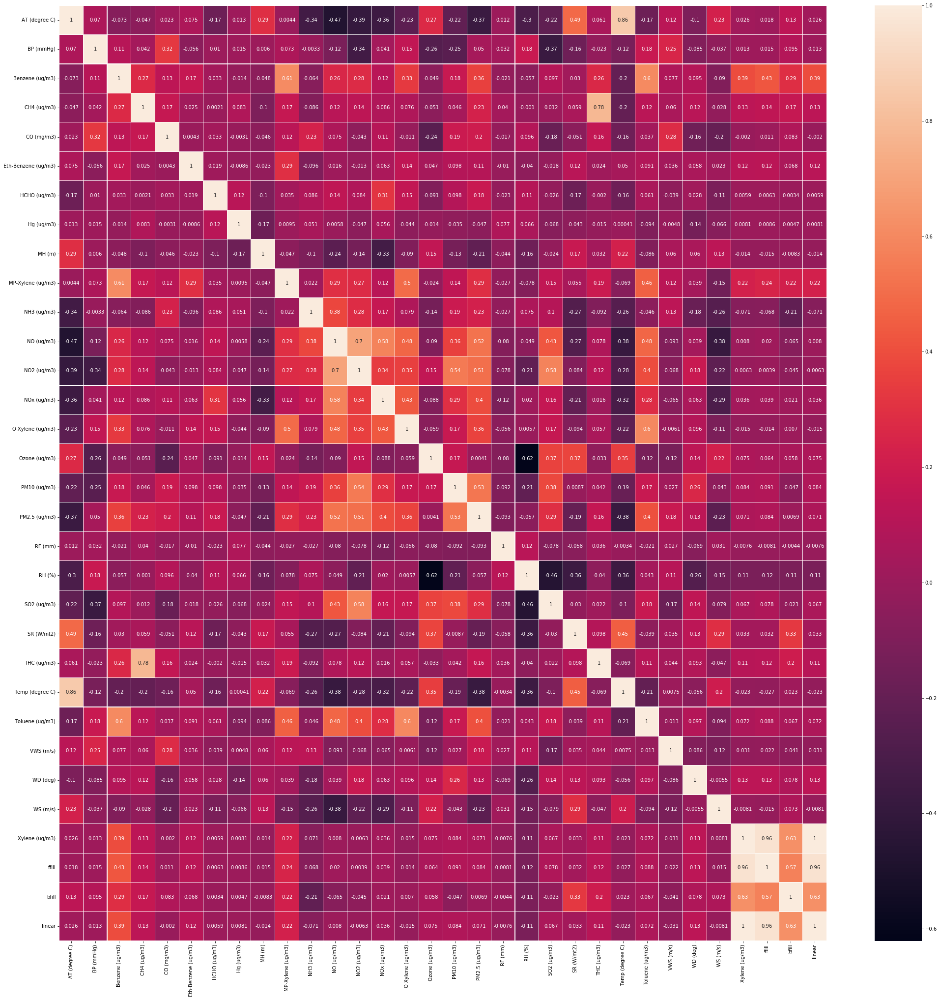

In [32]:
fig, ax = plt.subplots(figsize=(35,35)) 
sns.heatmap(d.corr(),annot=True,linewidths = 0.1 ,ax=ax)

In [39]:
valuelist =  [x for x in d.columns if x not in ['ffill','bfill','linear']]

Pointplot

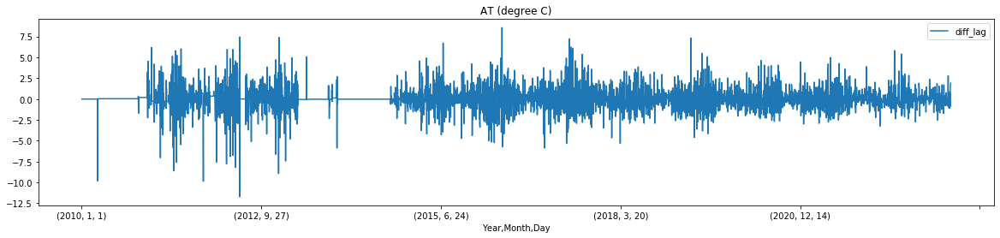

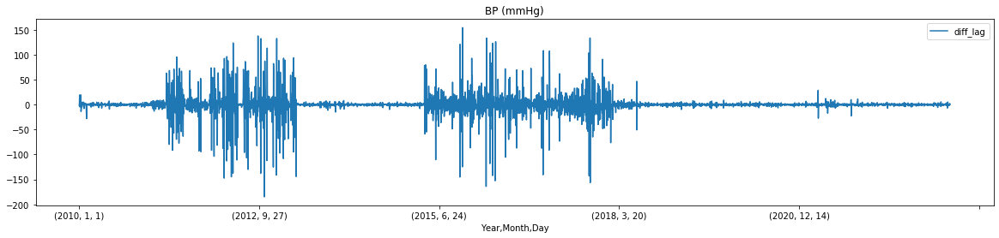

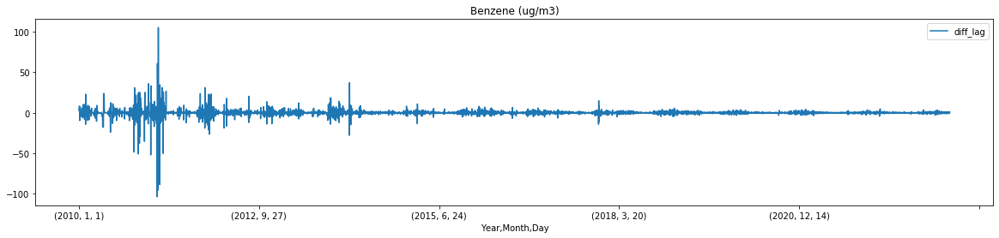

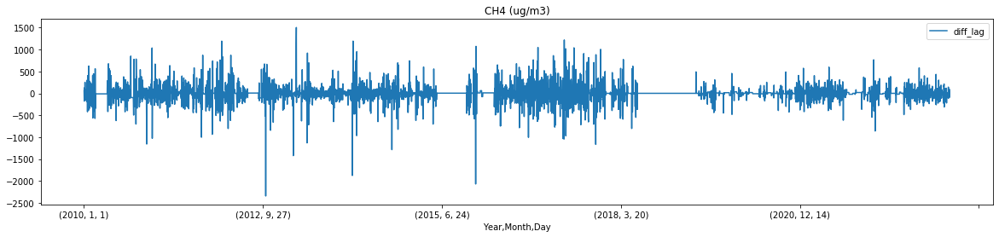

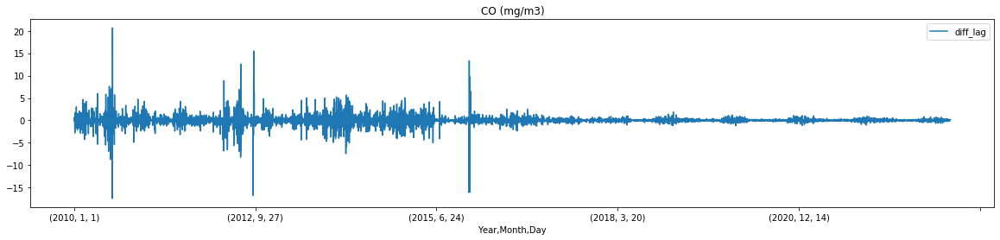

...

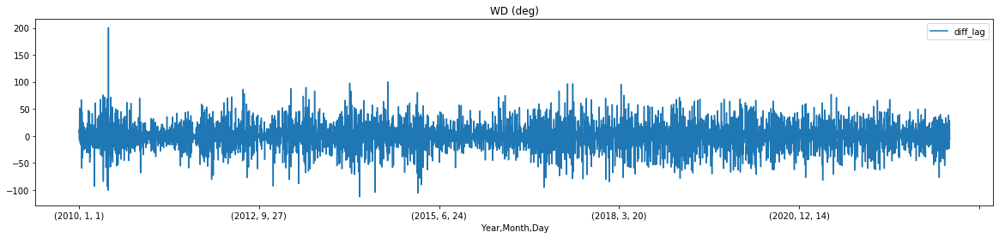

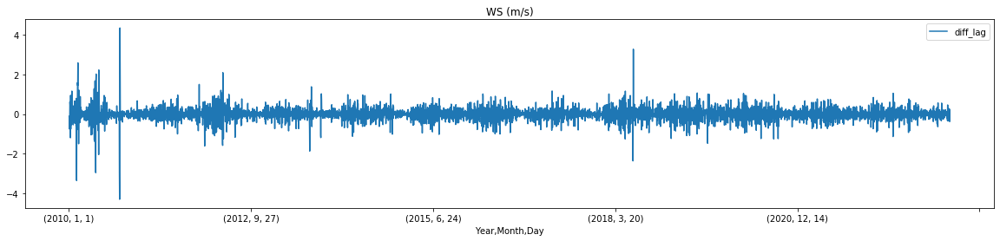

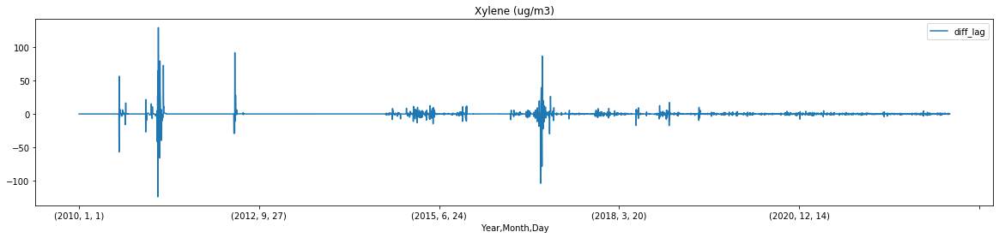

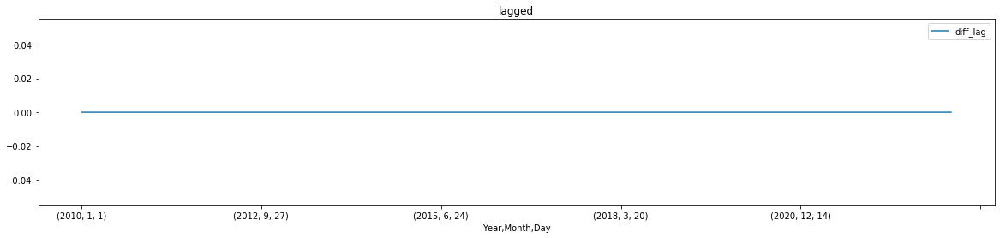

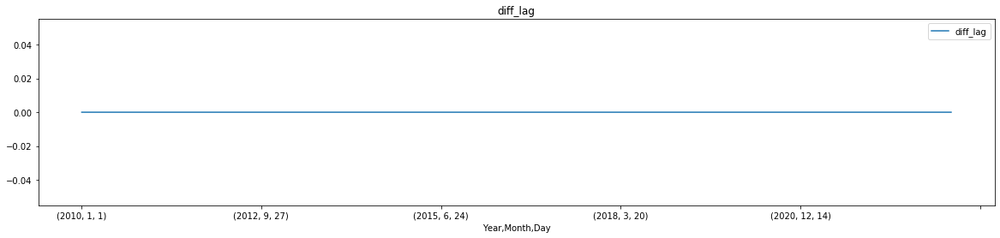

In [40]:
for x in valuelist:
    d["lagged"] = d[x].shift(periods=1)
    d["diff_lag"] = d["lagged"] - d[x]
    d["diff_lag"].plot(figsize=(20, 4));
    plt.title(x)
    plt.legend()
    plt.show()

In [41]:
y = d.groupby('Year')[valuelist].mean()
y

,AT (degree C),BP (mmHg),Benzene (ug/m3),CH4 (ug/m3),CO (mg/m3),Eth-Benzene (ug/m3),HCHO (ug/m3),Hg (ug/m3),MH (m),MP-Xylene (ug/m3),...,SR (W/mt2),THC (ug/m3),Temp (degree C),Toluene (ug/m3),VWS (m/s),WD (deg),WS (m/s),Xylene (ug/m3),lagged,diff_lag
Year,,,,,,,,,,,,,,,,,,,,,
2010,29.829929,972.581826,10.435542,1084.005255,3.516206,8.877003,39.616096,1.896696,434.551444,11.934395,...,213.160084,1304.275561,25.336667,32.484623,0.859629,181.292222,1.363082,2.224391,0.0,0.0
2011,27.828357,933.988676,13.174247,1031.470927,2.345131,35.925227,39.616096,1.896696,434.551444,14.490224,...,157.686521,1154.419757,24.724531,29.398679,0.848556,212.927427,1.247648,8.732441,0.0,0.0
2012,25.954508,899.541608,6.057092,654.891438,3.828769,4.841236,39.616096,1.896696,434.551444,7.488215,...,170.126391,857.720344,24.823605,21.108412,2.318221,203.446114,1.369232,4.086505,0.0,0.0
2013,27.308586,982.299153,6.400862,627.826813,3.296646,8.170751,39.616096,1.896696,434.551444,11.727884,...,135.909678,783.498988,25.324174,20.178013,4.764973,168.952124,0.821563,0.000003,0.0,0.0
2014,28.306353,1010.277813,4.139681,741.267373,7.210556,3.410169,39.616096,1.896696,434.551444,4.482953,...,116.163322,1009.883027,24.977703,9.921748,1.899967,153.051921,0.946997,1.187773,0.0,0.0
2015,26.600138,899.897245,3.855970,515.052366,3.611878,3.684181,39.616096,1.896696,434.551444,3.632660,...,133.517943,850.475478,24.618681,11.041633,0.462128,164.194481,0.979846,3.094035,0.0,0.0
2016,25.295550,856.485694,5.123123,843.232181,1.975238,4.091383,39.616096,1.896696,434.551444,5.298703,...,143.283543,1060.249252,26.077968,15.428184,0.029666,170.393518,1.084998,2.163674,0.0,0.0
2017,25.625332,848.575999,4.167896,673.044276,1.321473,5.629821,39.616096,1.896696,434.551444,8.076862,...,142.076691,931.655202,27.113626,15.907985,0.068665,183.382697,0.846691,4.691792,0.0,0.0
2018,25.535791,933.979880,3.824613,397.421999,1.400624,4.151898,38.379785,1.860448,254.239715,5.060294,...,145.154958,526.873551,27.313984,25.375636,0.131827,175.433398,1.377600,1.981334,0.0,0.0


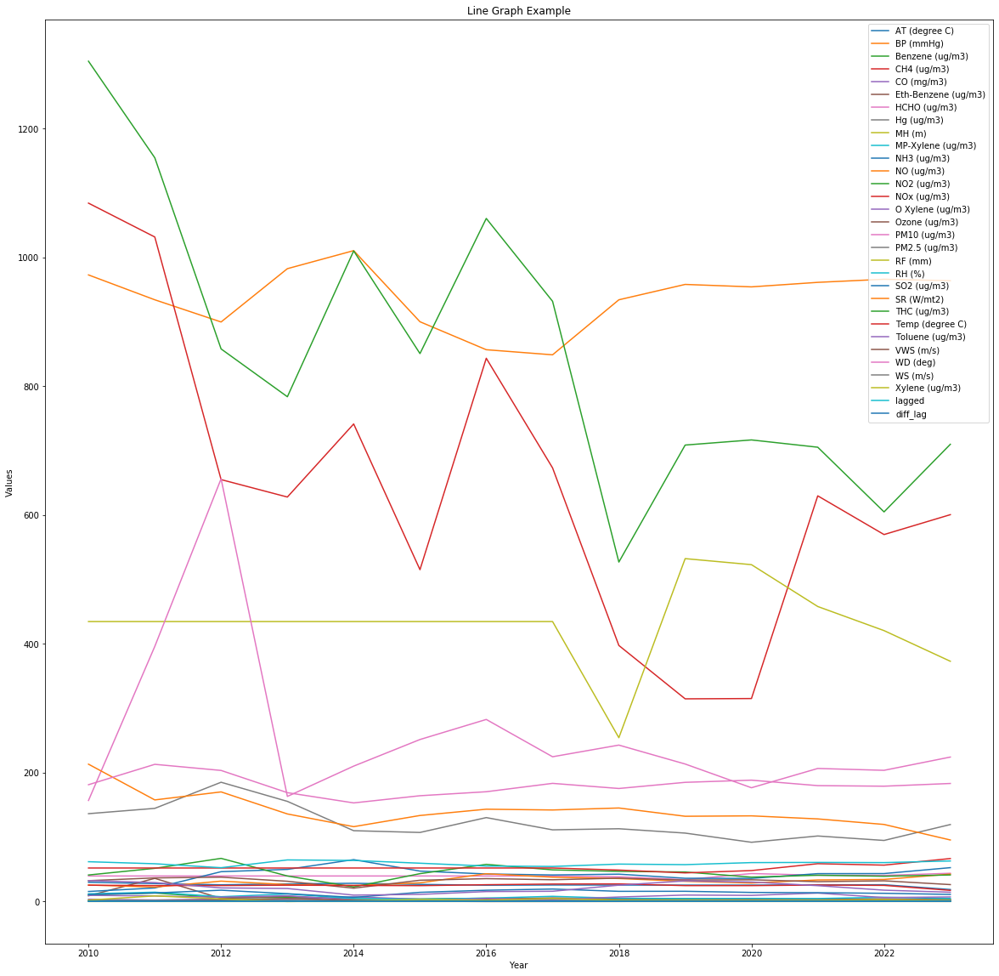

In [42]:
y.plot(kind='line',figsize=(20,20))
plt.xlabel('Year ')
plt.ylabel('Values')
plt.title('Line Graph Example')
plt.legend()
plt.show()

In [43]:
correlationlist=[]
for x in valuelist:
    for y in valuelist:
        if x is not y:
            if d[x].corr(d[y])>0.9:
                correlationlist.append(x,y)  

In [44]:
correlationlist

[]

Plotting Regplots

In [45]:
climate_parameters=['SR (W/mt2)','Temp (degree C)', 'AT (degree C)','RH (%)','RF (mm)','BP (mmHg)','WD (deg)', 'WS (m/s)']

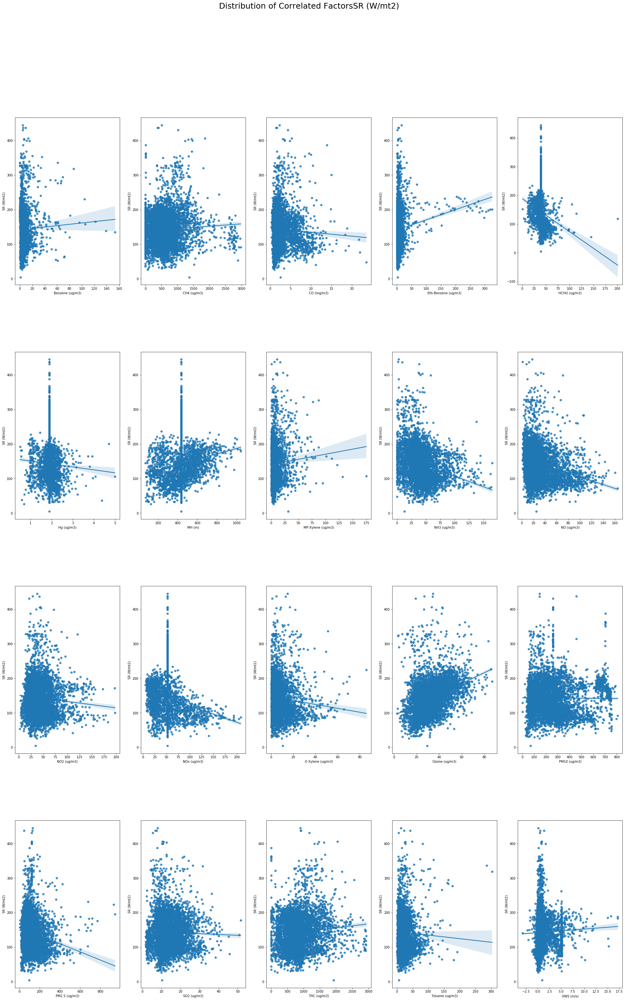

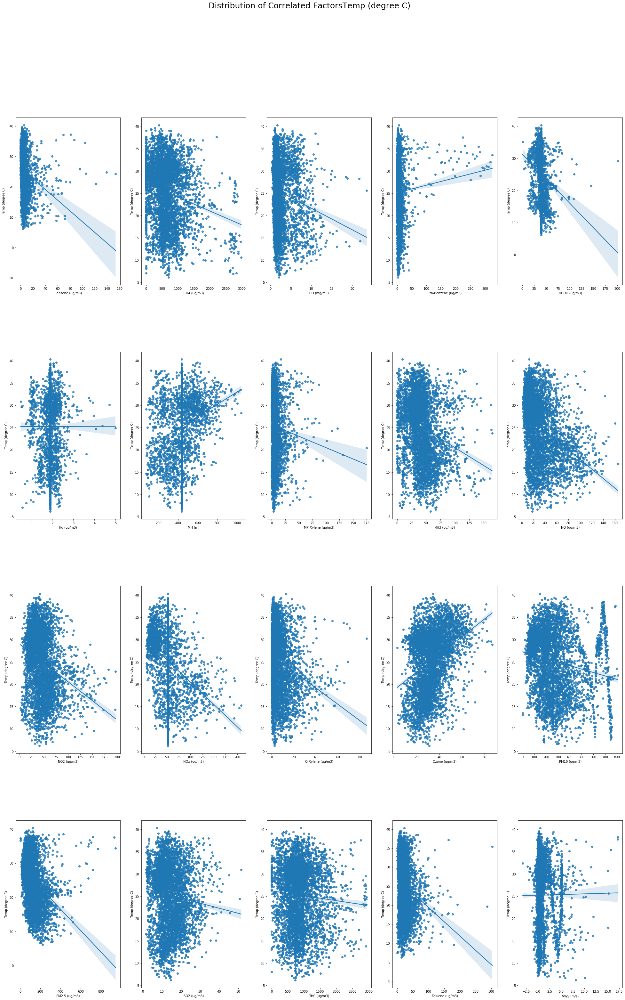

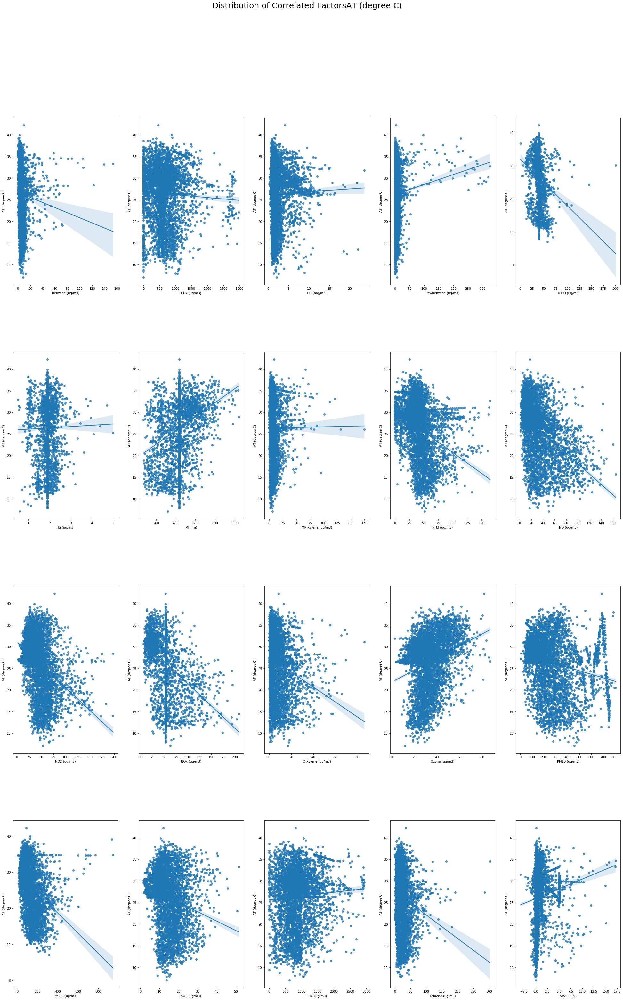

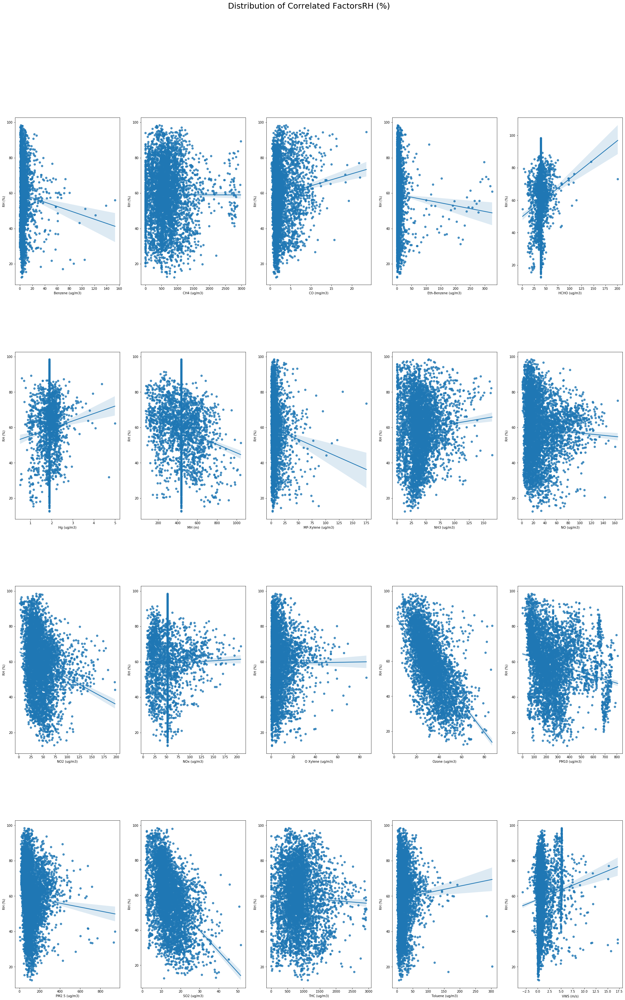

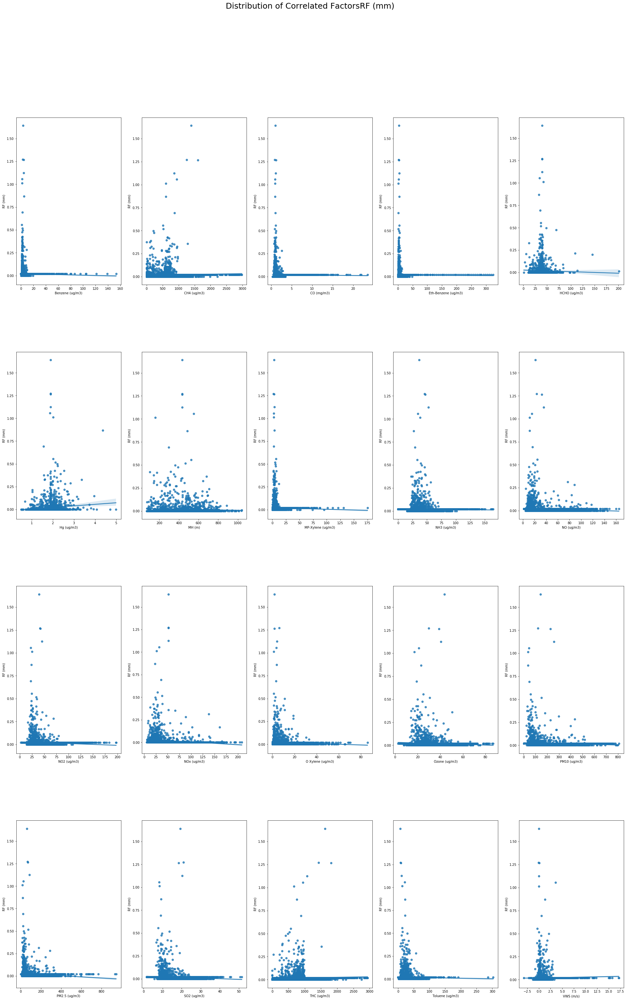

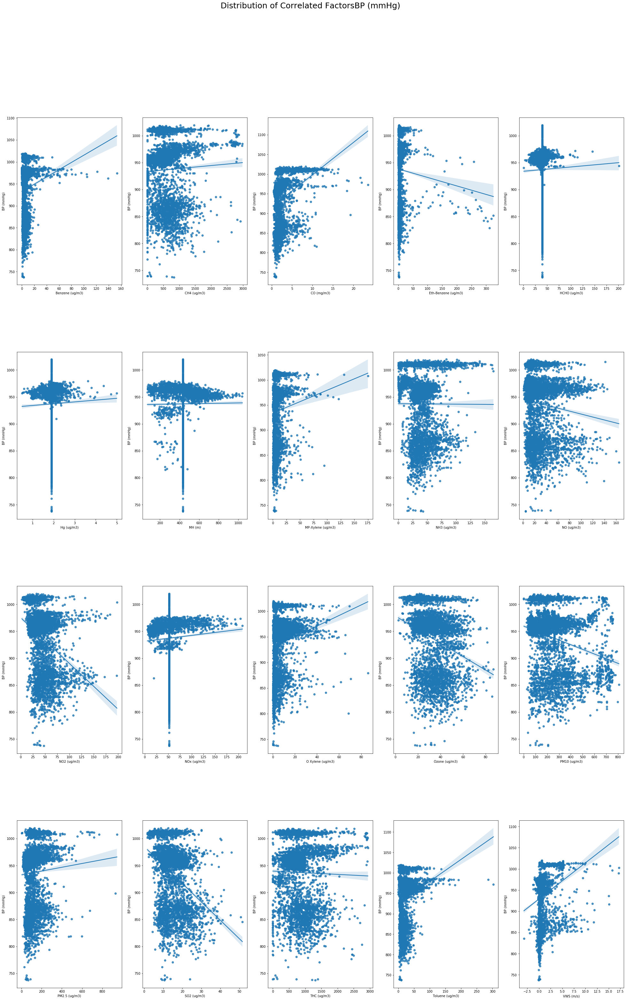

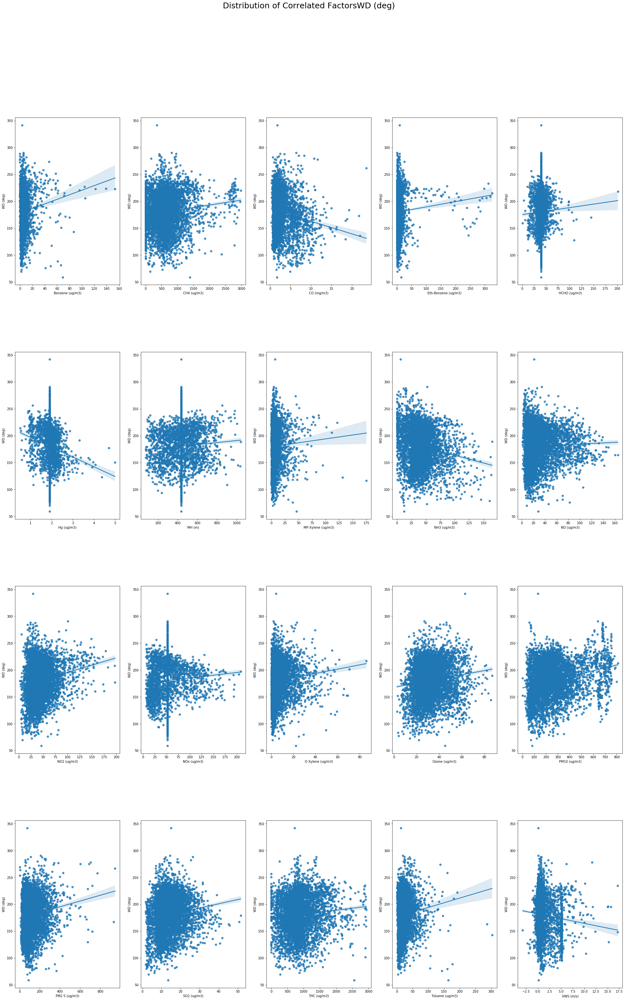

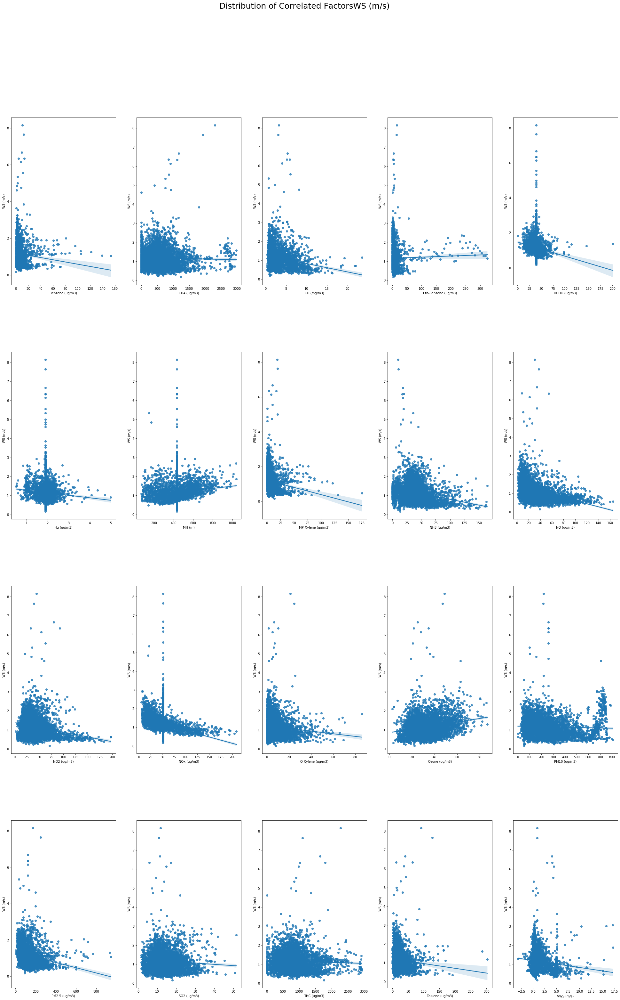

In [48]:
z = pd.Series()
for pollutant in d.columns.values[:-5]:
    if pollutant not in climate_parameters:
        colums=np.array(d[pollutant])
        z[pollutant]=colums

for r in climate_parameters:
    fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(34,50))
    plt.subplots_adjust(hspace=0.4)
    for i in range(4):
        for j in range(5):
            y_label=z.index[i*5+j]
            x_label=z[i*5+j]
            sns.regplot(data=d, x=z.index[i*5+j], y=r,ax=axes[i,j])
    fig.suptitle('Distribution of Correlated Factors'+r, fontsize='25')
    plt.show()

Decoding Dependencies

With analysis of the graphs above we can decode the following dependencies - 

Dependent variable: Independent variable
    'Solar Radiation' : ['SR (W/mt2)'],
    'Temperatures' : ['Temp (degree C)', 'AT (degree C)'],
    'Relative Humidity' : ['RH (%)'],
    'Rainfall' : ['RF (mm)'],
    'Barometric Pressure' : ['BP (mmHg)'],
    'Wind Direction' : ['WD (deg)'],
    'Wind Speed' : ['WS (m/s)']

Solar Radiation: CO, ,ETHBENZENE, , NO ozone  pm10
    
Temperatures :  ETH CO NOX OZONE PM10 SO2 THC
    
Relative Humidity: CO, NO

Wind Direction: CH4 CO EtHBenzene NH3 NO NO2
    
Wind Speed: CH4 ETH CO MH NH3 NO NO2

Defining Linear Regression

In [51]:
def linear_regression(X, y, res):

    X_train , X_test , y_train , y_test = train_test_split(X, y, test_size=0.2)
    X_train = pd.get_dummies(X_train)
    X_test = pd.get_dummies(X_test)
    LR = LinearRegression()
    LR.fit(X_train, y_train)
    predictions = LR.predict(X_test)

    print(X_test.shape, X_train.shape, y_test.shape, y_train.shape)
    print('r2_Square:%.2f '% r2_score(y_test, predictions))
    print('MSE:%.2f '% np.sqrt(mean_squared_error(y_test, predictions)))
    print("KfoldCrossVal mean score using Linear regression is %s" %cross_val_score(LR, X_train,y_train,cv=10).mean())
    
    regressor_OLS = smf.OLS(y_train, X_train).fit()
    
    plt.figure( figsize = (15, 15) )
    plt.scatter(predictions, y_test, alpha = 0.2)
    plt.xlabel('Predictions')
    plt.ylabel(res)
    plt.title("Linear Predictions")
    plt.show()
  
    Kfold = KFold(len(X), shuffle=True)
    
    p = print(regressor_OLS.summary())
    return p


In [52]:
def cross_val(X,y):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


    X_train = pd.get_dummies( X_train )
    X_test = pd.get_dummies( X_test )


    LR = LinearRegression()
    LR.fit(X_train, y_train)
    predictions = LR.predict( X_test )
    Kfold = KFold(len(X), shuffle=True)
    print("KfoldCrossVal mean score using Linear regression is %s" %cross_val_score(LR, X_train, y_train, cv = 10).mean())

Applying Linear Regression

(968, 6) (3870, 6) (968,) (3870,)
r2_Square:0.20 
MSE:46.85 
KfoldCrossVal mean score using Linear regression is 0.21271717334627027


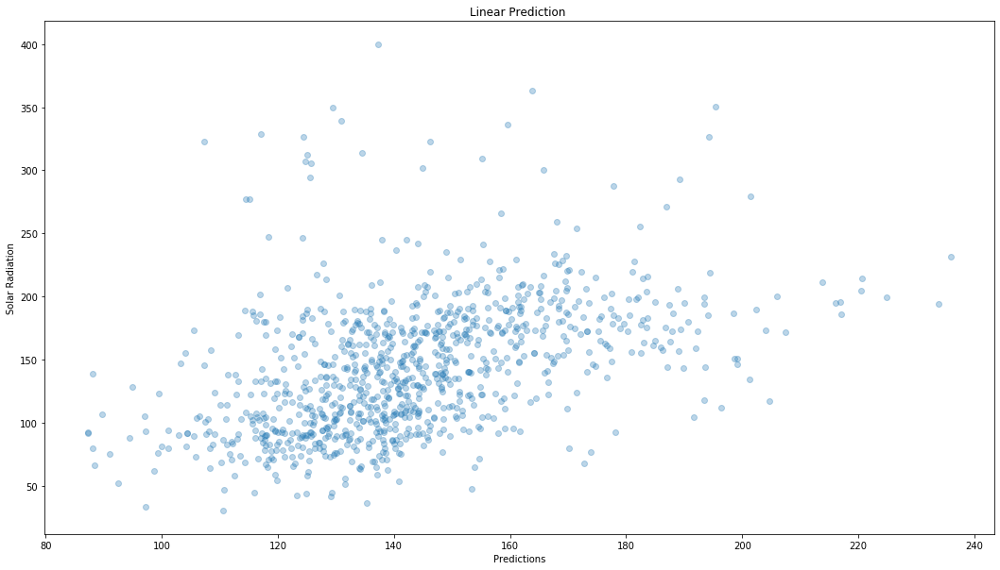

                                 OLS Regression Results                                
Dep. Variable:             SR (W/mt2)   R-squared (uncentered):                   0.876
Model:                            OLS   Adj. R-squared (uncentered):              0.875
Method:                 Least Squares   F-statistic:                              4536.
Date:                Mon, 03 Jul 2023   Prob (F-statistic):                        0.00
Time:                        01:29:45   Log-Likelihood:                         -20894.
No. Observations:                3870   AIC:                                  4.180e+04
Df Residuals:                    3864   BIC:                                  4.184e+04
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------

In [53]:
X=d[['NO (ug/m3)','CO (mg/m3)','Eth-Benzene (ug/m3)','Ozone (ug/m3)','PM10 (ug/m3)','SO2 (ug/m3)']]
y=d['SR (W/mt2)']
linear_regression(X,y,"Solar Radiation")


(968, 6) (3870, 6) (968,) (3870,)
r2_Square:0.27 
MSE:5.96 
KfoldCrossVal mean score using Linear regression is 0.24889329232250473


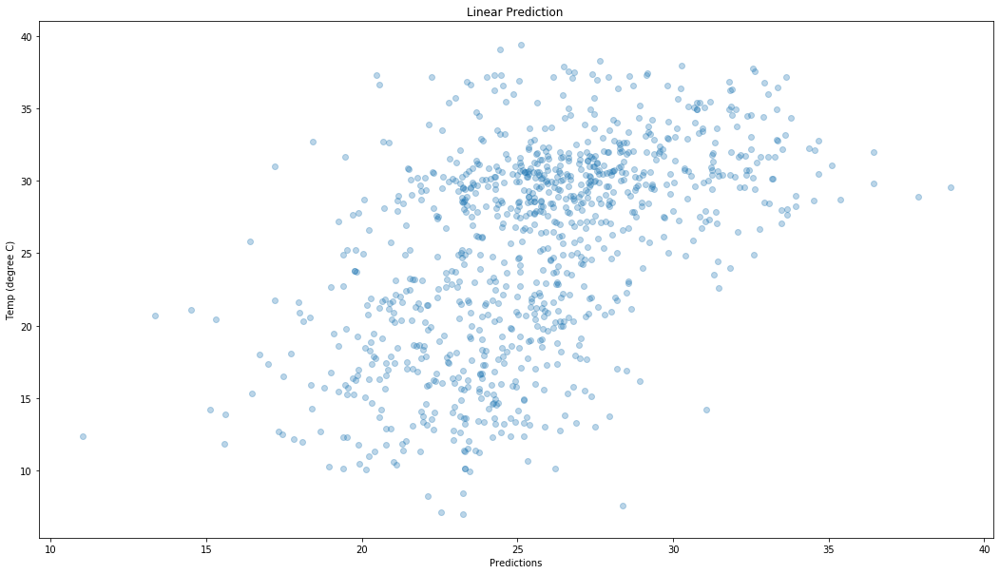

                                 OLS Regression Results                                
Dep. Variable:        Temp (degree C)   R-squared (uncentered):                   0.893
Model:                            OLS   Adj. R-squared (uncentered):              0.893
Method:                 Least Squares   F-statistic:                              5393.
Date:                Mon, 03 Jul 2023   Prob (F-statistic):                        0.00
Time:                        01:29:55   Log-Likelihood:                         -13795.
No. Observations:                3870   AIC:                                  2.760e+04
Df Residuals:                    3864   BIC:                                  2.764e+04
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------

In [54]:
X=d[['NOx (ug/m3)','CO (mg/m3)','Eth-Benzene (ug/m3)','Ozone (ug/m3)','PM10 (ug/m3)','SO2 (ug/m3)']]
y=d['Temp (degree C)']
linear_regression(X,y,"Temp (degree C)")

    